# Massive Post on Image Processing And Preparation For Deep Learning in Python
## Manipulate and transform images at will
![](images/unsplash.jpg)
<figcaption style="text-align: center;">
    <strong>
        Photo by 
        <a href='https://unsplash.com/@pkprasad1996?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText'>Prasad Panchakshari</a>
        on 
        <a href='https://unsplash.com/s/photos/kitten?utm_source=unsplash&utm_medium=referral&utm_content=creditCopyText'>Unsplash</a>
    </strong>
</figcaption>

## Introduction

## Setup

In [5]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage  # pip install scikit-image

warnings.filterwarnings("ignore")

In [6]:
def show(image: np.ndarray, title="Image", cmap_type="gray", axis=False):
    """
    A function to display np.ndarrays as images
    """
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    if not axis:
        plt.axis("off")
    plt.margins(0, 0)
    plt.show();

In [7]:
def compare(
    original, filtered, title_filtered="Filtered", cmap_type="gray", axis=False
):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 8), sharex=True, sharey=True)

    ax1.imshow(original, cmap=cmap_type)
    ax1.set_title("Original")

    ax2.imshow(filtered, cmap=cmap_type)
    ax2.set_title(title_filtered)

    if not axis:
        ax1.axis("off")
        ax2.axis("off")
    plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0.01)
    plt.margins(0, 0)
    plt.show();

## Basics

### 1. Image basics with NumPy and Skimage

In [8]:
from skimage.io import imread

image = imread("images/colorful_scenery.jpg")

type(image)

numpy.ndarray

In [9]:
image.shape

(853, 1280, 3)

In [10]:
image.size  # 853 * 1280 * 3

3275520

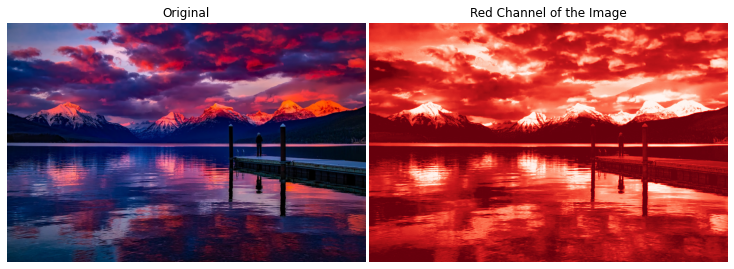

In [11]:
red = image[:, :, 0]

compare(image, red, "Red Channel of the Image", cmap_type="Reds_r")

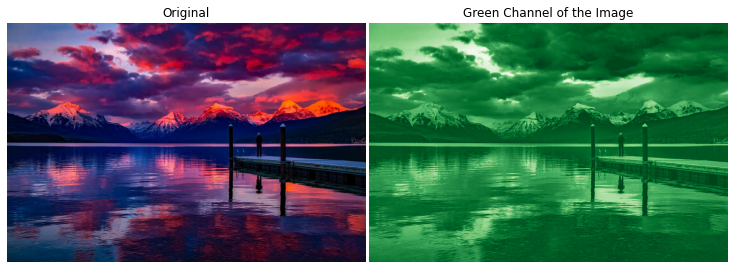

In [12]:
green = image[:, :, 1]

compare(image, green, "Green Channel of the Image", "Greens_r")

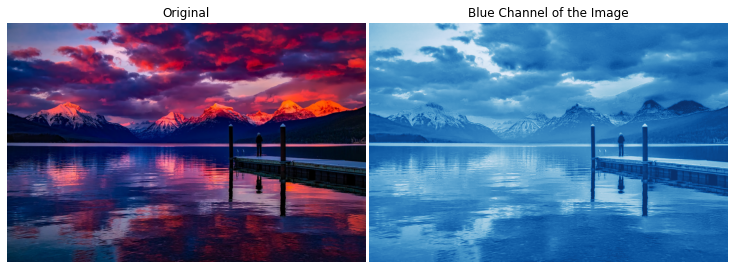

In [13]:
blue = image[:, :, 2]

compare(image, blue, "Blue Channel of the Image", "Blues_r")

### 2. Common transformations

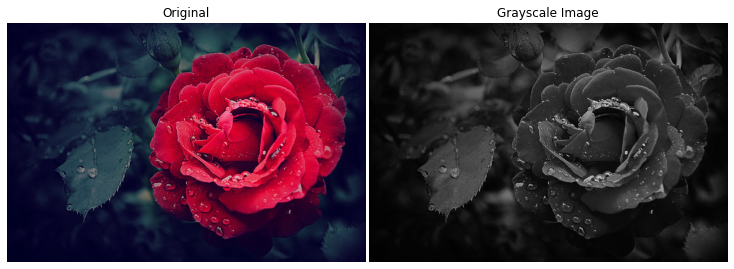

In [14]:
from skimage.color import rgb2gray

image = imread("images/grayscale_example.jpg")
gray = rgb2gray(image)

compare(image, gray, "Grayscale Image")

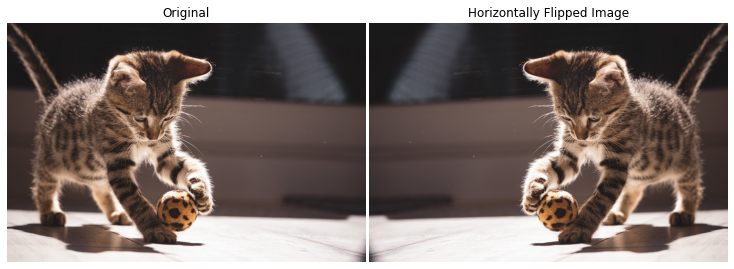

In [15]:
kitten = imread("images/horizontal_flip.jpg")
horizontal_flipped = np.fliplr(kitten)

compare(kitten, horizontal_flipped, "Horizontally Flipped Image")

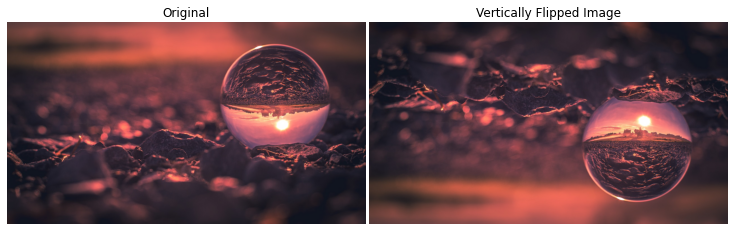

In [16]:
ball = imread("images/upside_down.jpg")
vertically_flipped = np.flipud(ball)

compare(ball, vertically_flipped, "Vertically Flipped Image")

### 3. Histogram of color channels

In [17]:
def plot_with_hist_channel(image, channel):
    channels = ["red", "green", "blue"]
    channel_idx = channels.index(channel)

    extracted_channel = image[:, :, channel_idx]
    fig, (ax1, ax2) = plt.subplots(
        ncols=2, figsize=(18, 6)
    )  # , sharex=True, sharey=True)

    ax1.imshow(image)
    ax1.axis("off")
    ax2.hist(extracted_channel.ravel(), bins=256)
    ax2.set_title(f"{channels[channel_idx]} histogram")

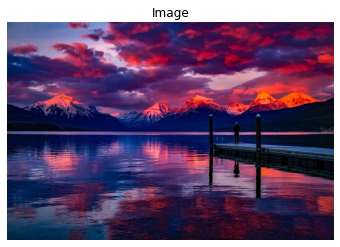

In [18]:
colorful_scenery = imread("images/colorful_scenery.jpg")

show(colorful_scenery)

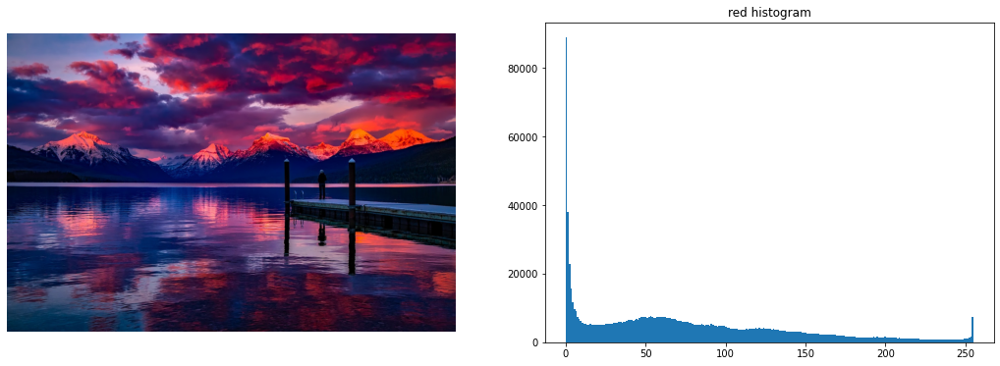

In [19]:
plot_with_hist_channel(colorful_scenery, "red")

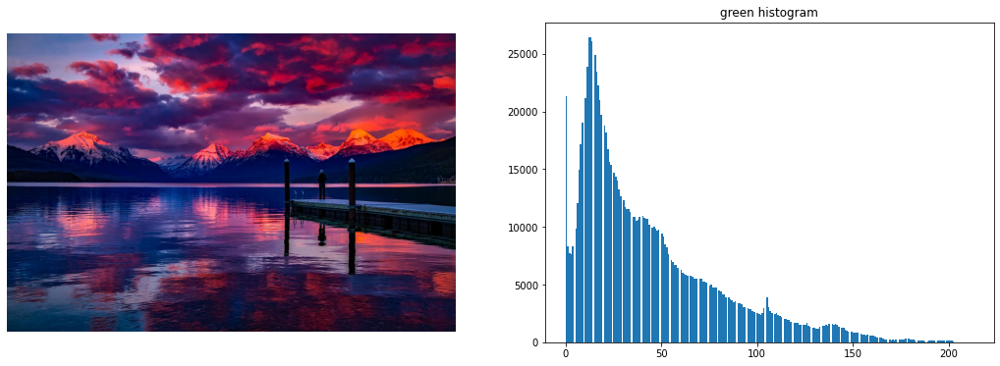

In [20]:
plot_with_hist_channel(colorful_scenery, "green")

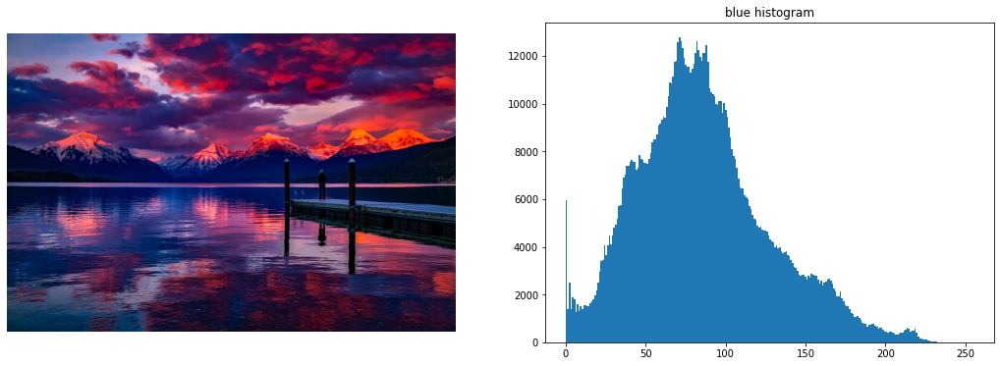

In [21]:
plot_with_hist_channel(colorful_scenery, "blue")

## Filters

### 1. Manual thresholding

In [22]:
stag = imread("images/binary_example.jpg")

# Convert to graysacle
stag_gray = rgb2gray(stag)

In [23]:
stag_gray.mean()

0.20056262759859955

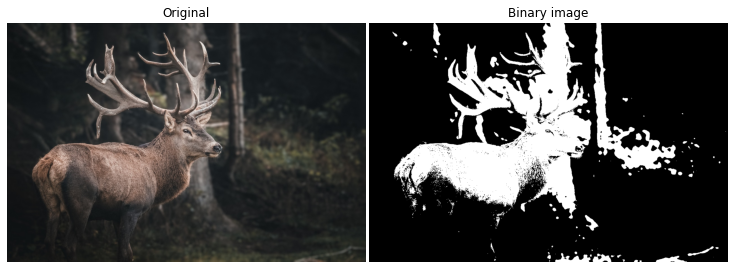

In [24]:
# Set threshold
threshold = 0.25
# Binarize
binary_image = stag_gray > threshold

compare(stag, binary_image, "Binary image")

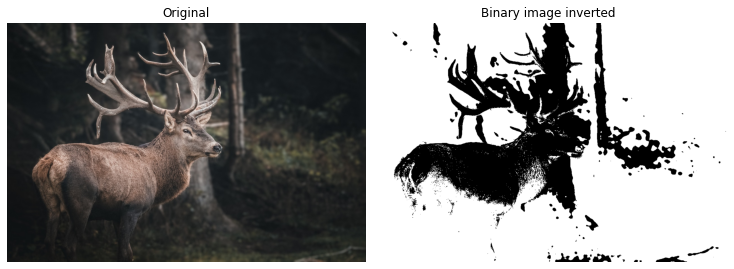

In [25]:
inverted_binary = stag_gray <= threshold

compare(stag, inverted_binary, "Binary image inverted")

### 2. Thresholding - global

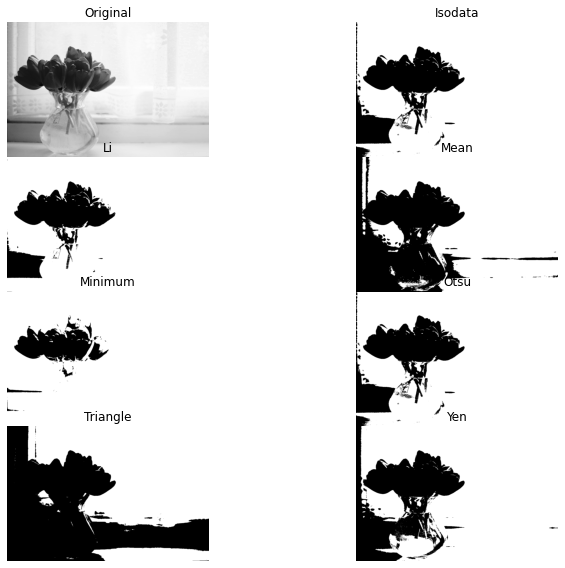

In [26]:
from skimage.filters import try_all_threshold

flower = imread("images/global_threshold_ex.jpg")
flower_gray = rgb2gray(flower)

fig, ax = try_all_threshold(flower_gray, figsize=(10, 8), verbose=False)
plt.subplots_adjust(wspace=0, hspace=0)

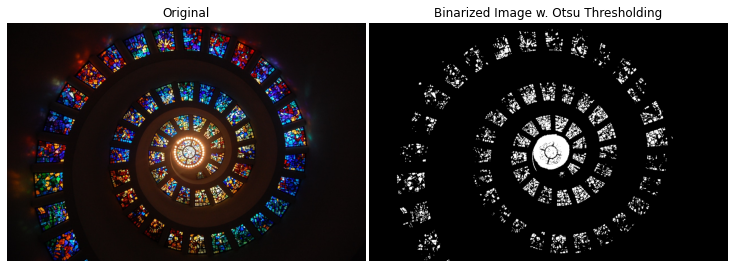

In [27]:
from skimage.filters import threshold_otsu

spiral = imread("images/otsu_example.jpg")
spiral_gray = rgb2gray(spiral)

# Find optimal threshold
threshold = threshold_otsu(spiral_gray)

# Binarize
binary_spiral = spiral_gray > threshold

compare(spiral, binary_spiral, "Binarized Image w. Otsu Thresholding")

### 3. Thresholding - local

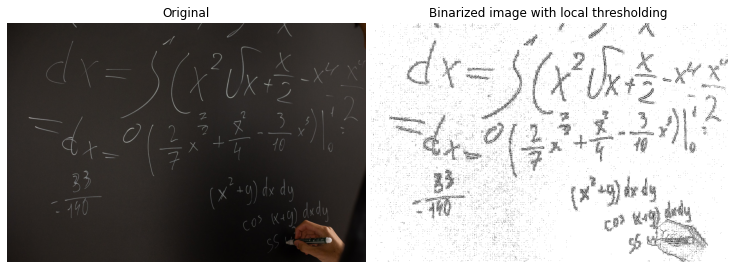

In [29]:
from skimage.filters import threshold_local

handwriting = imread("images/chalk_writing.jpg")
handwriting_gray = rgb2gray(handwriting)

# Find optimal threshold using local
local_thresh = threshold_local(handwriting_gray, offset=0.0003)

# Binarize
binary_handwriting = handwriting_gray > local_thresh

compare(handwriting, binary_handwriting, "Binarized image with local thresholding")

### 4. Edge detection

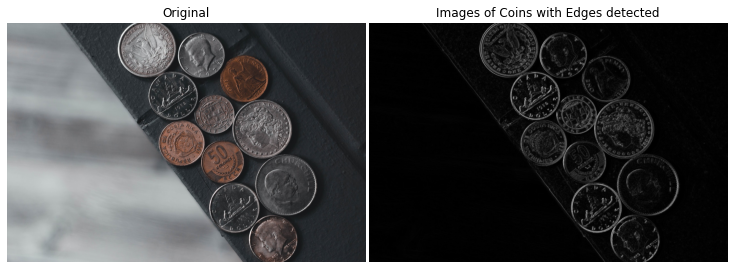

In [30]:
from skimage.feature import canny
from skimage.filters import sobel

coins = imread("images/coins_2.jpg")
coins_gray = rgb2gray(coins)

coins_edge = sobel(coins_gray)

compare(coins, coins_edge, "Images of Coins with Edges detected")

### 5. Smoothing

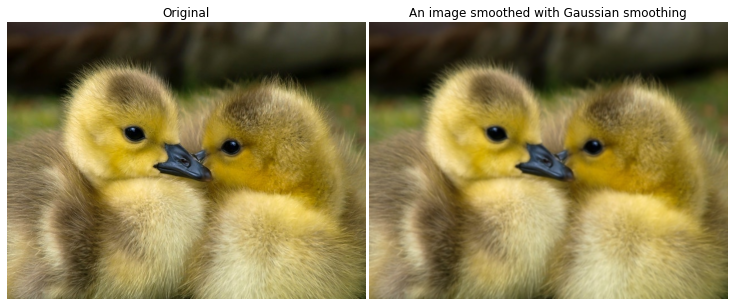

In [31]:
from skimage.filters import gaussian

chickens = imread("images/chickens.jpg")

smoothed = gaussian(chickens, multichannel=True)

compare(chickens, smoothed, "An image smoothed with Gaussian smoothing")

### 6. Contrast enhancement

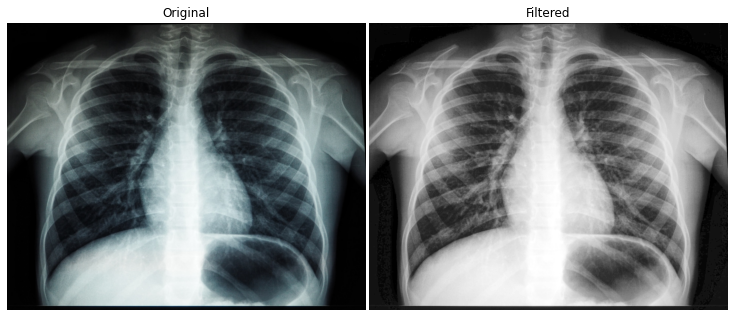

In [32]:
from skimage.exposure import equalize_hist

xray = imread("images/xray.jpg")
xray_gray = rgb2gray(xray)

enhanced = equalize_hist(xray_gray)

compare(xray, enhanced)

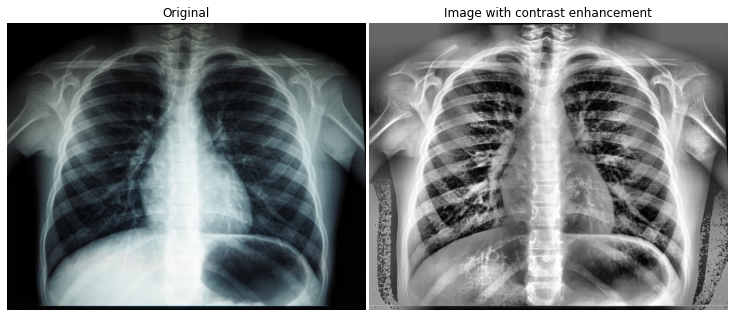

In [33]:
from skimage.exposure import equalize_adapthist

# Adjust clip_limit
enhanced_adaptive = equalize_adapthist(xray_gray, clip_limit=0.4)

compare(xray, enhanced_adaptive, "Image with contrast enhancement")

### 7. Transformations

**Rotations**

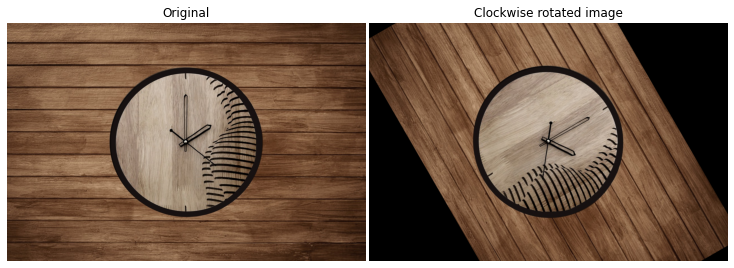

In [34]:
from skimage.transform import rotate

clock = imread("images/clock.jpg")

clockwise = rotate(clock, angle=-60)
compare(clock, clockwise, "Clockwise rotated image")

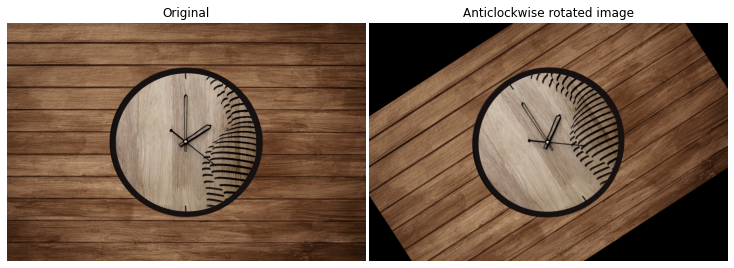

In [35]:
anti_clockwise = rotate(clock, angle=33)

compare(clock, anti_clockwise, "Anticlockwise rotated image")

**Rescaling**

In [36]:
from skimage.transform import rescale

butterflies = imread("images/butterflies.jpg")
butterflies.shape

(720, 1280, 3)

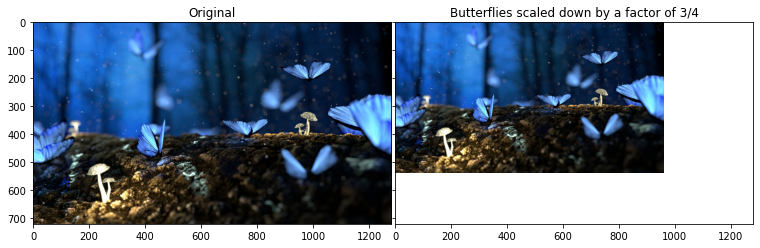

In [37]:
scaled_butterflies = rescale(butterflies, scale=3 / 4, multichannel=True)

compare(
    butterflies,
    scaled_butterflies,
    "Butterflies scaled down by a factor of 3/4",
    axis=True,
)

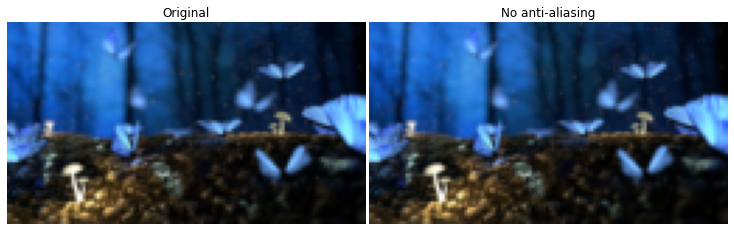

In [38]:
factor_10_aa = rescale(butterflies, scale=1 / 10, multichannel=True, anti_aliasing=True)
factor_10_no_aa = rescale(butterflies, scale=1 / 10, multichannel=True)

compare(factor_10_aa, factor_10_no_aa, "No anti-aliasing")

**Resizing**

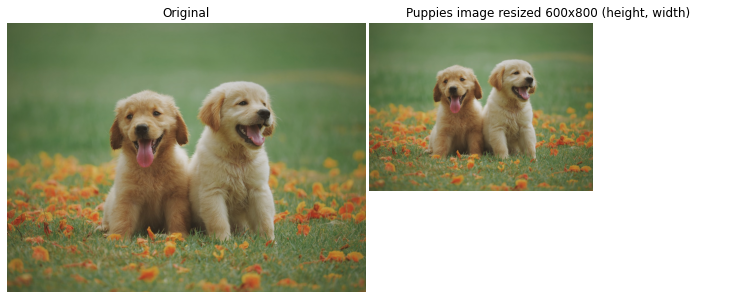

In [39]:
from skimage.transform import resize

puppies = imread("images/puppies.jpg")

# Also possible to set anti_aliasing
puppies_600_800 = resize(puppies, output_shape=(600, 800))

compare(puppies, puppies_600_800, "Puppies image resized 600x800 (height, width)")

## Image restoration and enhancement

### 1. Inpainting

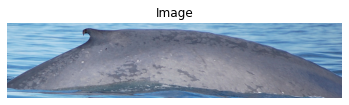

In [40]:
whale_image = imread("images/00206a224e68de.jpg")

show(whale_image)

In [41]:
whale_image.shape

(428, 1916, 3)

In [42]:
def make_mask(image):
    """Create a mask to artificially defect the image."""

    mask = np.zeros(image.shape[:-1])

    # Make 4 masks
    mask[250:300, 1400:1600] = 1
    mask[50:100, 300:433] = 1
    mask[300:380, 1000:1200] = 1
    mask[200:270, 750:950] = 1

    return mask.astype(bool)

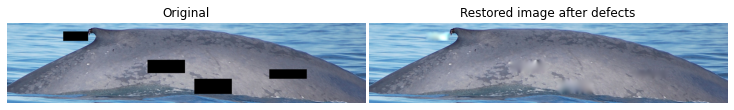

In [43]:
from skimage.restoration import inpaint

# Create the mask
mask = make_mask(whale_image)
# Apply the defect mask on the whale_image
image_defect = whale_image * ~mask[..., np.newaxis]

restored_image = inpaint.inpaint_biharmonic(
    image=image_defect, mask=mask, multichannel=True, channel_axis=-1
)

compare(image_defect, restored_image, "Restored image after defects")

### 2. Noise

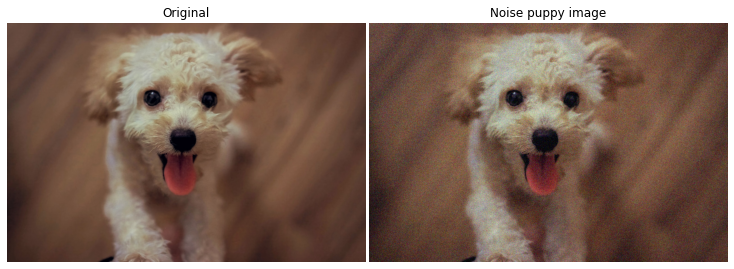

In [44]:
from skimage.util import random_noise

pup = imread("images/pup.jpg")

noisy_pup = random_noise(pup)

compare(pup, noisy_pup, "Noise puppy image")

### 3. Reducing noise - denoising

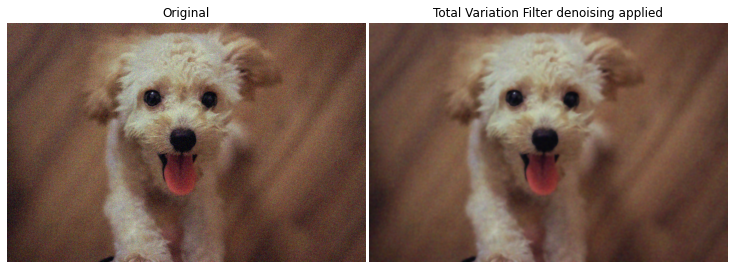

In [45]:
from skimage.restoration import denoise_tv_chambolle

denoised_pup_tv = denoise_tv_chambolle(noisy_pup, weight=0.2, multichannel=True)

compare(noisy_pup, denoised_pup_tv, "Total Variation Filter denoising applied")

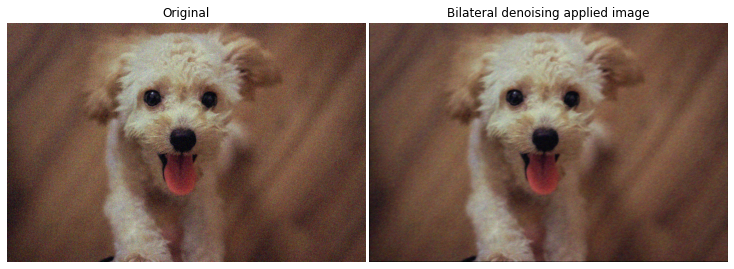

In [46]:
from skimage.restoration import denoise_bilateral

denoised_pup_bilateral = denoise_bilateral(noisy_pup, multichannel=True)

compare(noisy_pup, denoised_pup_bilateral, "Bilateral denoising applied image")

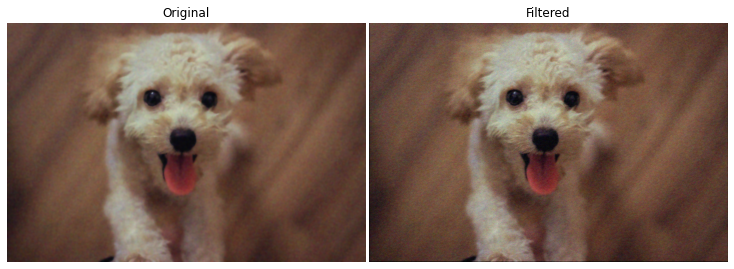

In [47]:
compare(denoised_pup_tv, denoised_pup_bilateral)

### 4. Superpixels and Segmentation

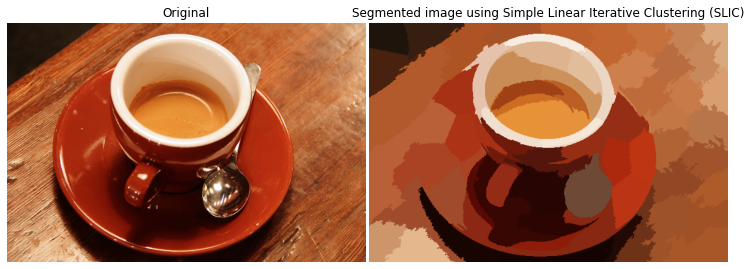

In [48]:
from skimage import data
from skimage.color import label2rgb
from skimage.segmentation import slic

coffee = data.coffee()


def segment(image, n_segments=100):
    # Obtain superpixels / segments
    superpixels = slic(coffee, n_segments=n_segments)

    # Put the groups on top of the original image
    segmented_image = label2rgb(superpixels, image, kind="avg")

    return segmented_image


segmented_coffee = segment(coffee)

compare(
    coffee,
    segmented_coffee,
    "Segmented image using Simple Linear Iterative Clustering (SLIC)",
)

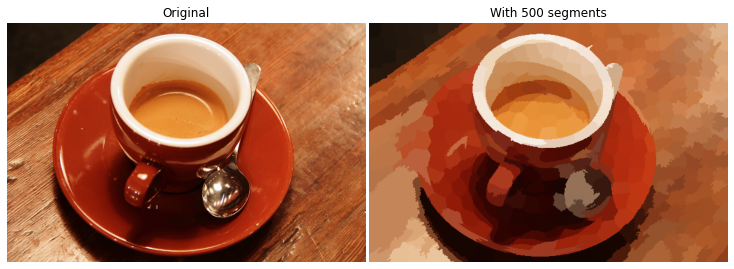

In [49]:
coffee_segmented_2 = segment(coffee, n_segments=500)

compare(coffee, coffee_segmented_2, "With 500 segments")

### 5. Contours

In [102]:
from skimage.filters import threshold_otsu
from skimage.measure import find_contours

dominoes = imread("images/dominoes.jpg")
# dominoes = denoise_tv_chambolle(dominoes, multichannel=True)


def contours(image):
    """A function to find contours from an image"""
    gray_image = rgb2gray(image)
    # Find optimal threshold
    thresh = threshold_otsu(gray_image)
    # Mask
    binary_image = gray_image > thresh

    contours = find_contours(binary_image)

    return contours

In [104]:
domino_contours = contours(dominoes)

for contour in domino_contours[:5]:
    print(contour.shape)

(371, 2)
(376, 2)
(4226, 2)
(177, 2)
(11, 2)


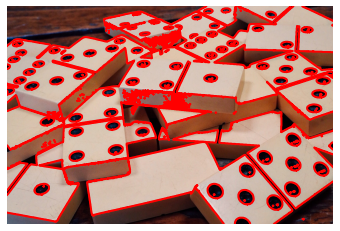

In [107]:
def plot_image_contours(image):
    fig, ax = plt.subplots()

    ax.imshow(image, cmap=plt.cm.gray)

    for contour in contours(image):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=2, color="red")

    ax.axis("off")


plot_image_contours(dominoes)

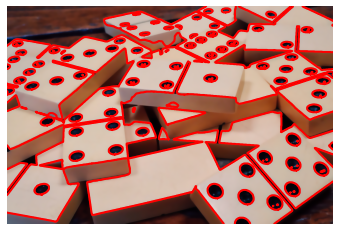

In [108]:
dominoes_denoised = denoise_tv_chambolle(dominoes, multichannel=True)

plot_image_contours(dominoes_denoised)

## Advanced operations

### 1. Edge detection

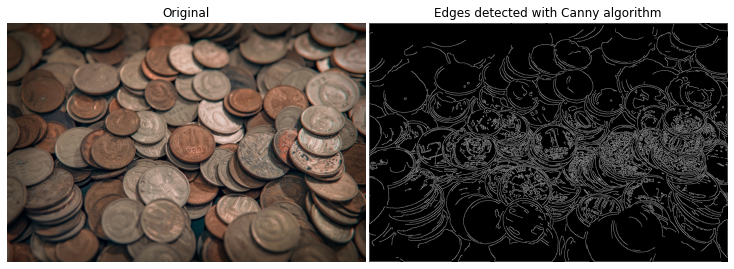

In [111]:
from skimage.feature import canny

coins_3 = imread("images/coins_3.jpg")

# Convert to gray
coins_3_gray = rgb2gray(coins_3)

# Find edges with canny
canny_edges = canny(coins_3_gray)

compare(coins_3, canny_edges, "Edges detected with Canny algorithm")

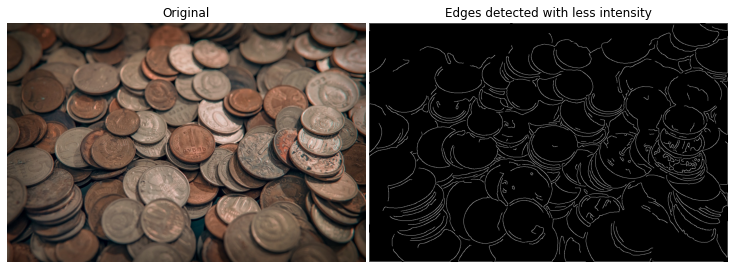

In [113]:
canny_edges_sigma_2 = canny(coins_3_gray, sigma=2.5)

compare(coins_3, canny_edges_sigma_2, "Edges detected with less intensity")

### 2. Corner detection

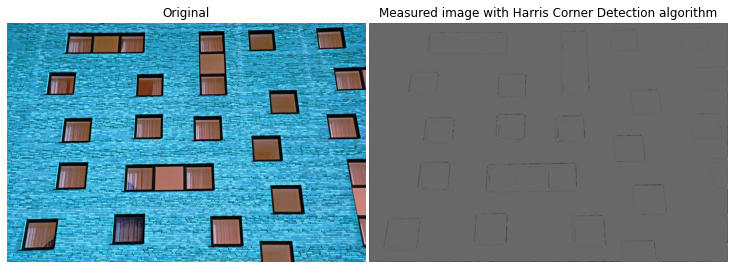

In [151]:
from skimage.feature import corner_harris

windows = imread("images/windows.jpg")
windows_denoised = denoise_tv_chambolle(windows, multichannel=True, weight=0.3)

windows_gray = rgb2gray(windows_denoised)

measured_image = corner_harris(windows_gray)

compare(
    windows, measured_image, "Measured image with Harris Corner Detection algorithm"
)

In [152]:
from skimage.feature import corner_peaks

corner_coords = corner_peaks(corner_harris(windows_gray), min_distance=50)

print(len(corner_coords))

84


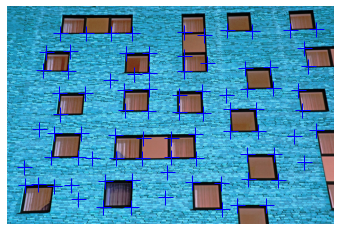

In [153]:
def show_image_cornered(image, coords):
    plt.imshow(image, cmap="gray")
    plt.plot(coords[:, 1], coords[:, 0], "+b", markersize=15)
    plt.axis("off")


show_image_cornered(windows, corner_coords)